In [25]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import timm

import matplotlib.pyplot as plt # For data viz
import pandas as pd
import numpy as np
import sys
from tqdm.notebook import tqdm

print('System Version:', sys.version)
print('PyTorch version', torch.__version__)
print('Torchvision version', torchvision.__version__)
print('Numpy version', np.__version__)
print('Pandas version', pd.__version__)

System Version: 3.11.9 | packaged by Anaconda, Inc. | (main, Apr 19 2024, 16:40:41) [MSC v.1916 64 bit (AMD64)]
PyTorch version 2.3.0+cu121
Torchvision version 0.18.0+cu121
Numpy version 1.26.4
Pandas version 2.2.2


In [26]:
class ArtDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data = ImageFolder(data_dir, transform=transform)
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        return self.data[idx]
    
    @property
    def classes(self):
        return self.data.classes

In [27]:
dataset = ArtDataset(
    data_dir='dataset/train'
)

In [28]:
len(dataset)

6431

0


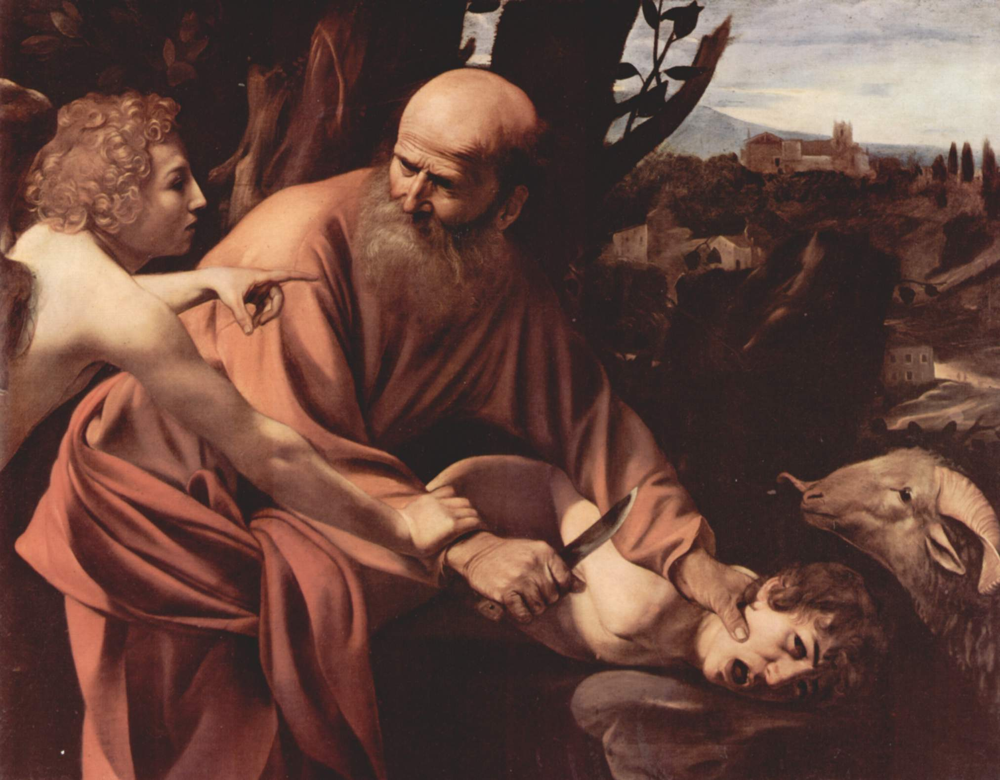

In [29]:
image, label = dataset[3]
print(label)
image

In [30]:
# Get a dictionary associating target values with folder names
data_dir = 'dataset/train'
target_to_class = {v: k for k, v in ImageFolder(data_dir).class_to_idx.items()}
print(target_to_class)

{0: 'Baroque', 1: 'Cubism', 2: 'Expressionism', 3: 'Impressionism', 4: 'Pop_Art', 5: 'Post-Impressionism', 6: 'Primitivism', 7: 'Renaissance', 8: 'Romanticism', 9: 'Suprematism', 10: 'Surrealism', 11: 'Symbolism'}


In [31]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

data_dir = 'dataset/train'
dataset = ArtDataset(data_dir, transform)

In [32]:
image, label = dataset[100]
image.shape

torch.Size([3, 128, 128])

In [33]:
# iterate over dataset
for image, label in dataset:
    break

In [34]:
dataloader = DataLoader(dataset, batch_size=128, shuffle=True)

In [35]:
for images, labels in dataloader:
    break

In [36]:
images.shape, labels.shape

(torch.Size([128, 3, 128, 128]), torch.Size([128]))

In [37]:
labels

tensor([ 3,  3,  4,  3,  7,  0,  7,  9,  8,  1, 10,  3,  5,  3,  5,  3,  3,  5,
         6,  3,  5,  3,  2,  7,  5,  3,  7,  7,  7,  3,  7,  7,  7,  1,  3,  3,
         5,  5,  9,  3,  0,  5,  3,  1,  2,  7, 11,  5,  2,  2,  2,  3,  5,  1,
         7,  5, 11,  0,  3,  7, 10,  3,  5,  0,  2,  3,  0, 11,  1,  3,  7,  3,
         2,  3,  0,  5,  5,  5,  2, 10, 10,  5,  3,  6, 11,  5,  5,  0,  3,  3,
         0,  7,  3,  5,  2,  5,  5,  4,  7,  5,  7, 11,  3,  0,  1, 11,  3,  7,
         7,  5,  3,  3,  7, 11,  5, 11,  8, 11,  3,  3,  5,  4,  7,  3,  7,  2,
         7,  3])

# Pytorch Model

In [38]:
class SimpleArtClassifer(nn.Module):
    def __init__(self, num_classes=12):
        super(SimpleArtClassifer, self).__init__()
        # Where we define all the parts of the model
        self.base_model = timm.create_model('efficientnet_b0', pretrained=True)
        self.features = nn.Sequential(*list(self.base_model.children())[:-1])

        enet_out_size = 1280
        # Make a classifier
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(enet_out_size, num_classes)
        )
    
    def forward(self, x):
        # Connect these parts and return the output
        x = self.features(x)
        output = self.classifier(x)
        return output

In [39]:
model = SimpleArtClassifer(num_classes=12)
print(str(model)[:500])

SimpleArtClassifer(
  (base_model): EfficientNet(
    (conv_stem): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNormAct2d(
      32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): SiLU(inplace=True)
    )
    (blocks): Sequential(
      (0): Sequential(
        (0): DepthwiseSeparableConv(
          (conv_dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=Fals


In [40]:
example_out = model(images)
example_out.shape # [batch_size, num_classes]

torch.Size([128, 12])

# The Training loop

In [41]:
# Loss function
criterion = nn.CrossEntropyLoss()
# Optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [42]:
criterion(example_out, labels)
print(example_out.shape, labels.shape)

torch.Size([128, 12]) torch.Size([128])


In [43]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

train_folder = 'dataset/train/'
valid_folder = 'dataset/validation/'
test_folder = 'dataset/test/'

train_dataset = ArtDataset(train_folder, transform=transform)
val_dataset = ArtDataset(valid_folder, transform=transform)
test_dataset = ArtDataset(test_folder, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)
test_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)

In [44]:

num_epochs = 20
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = SimpleArtClassifer(num_classes=12)
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

for epoch in range(num_epochs):
    # Training phase
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for images, labels in tqdm(train_loader, desc='Training loop'):
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * labels.size(0)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader.dataset)
    train_accuracy = correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    
    # Validation phase
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc='Validation loop'):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * labels.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    val_loss = running_loss / len(val_loader.dataset)
    val_accuracy = correct / total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)
    
    print(f"Epoch {epoch+1}/{num_epochs} - Train loss: {train_loss:.4f}, Validation loss: {val_loss:.4f}, Train Accuracy: {train_accuracy*100:.2f}%, Validation Accuracy: {val_accuracy*100:.2f}%")

Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 1/20 - Train loss: 2.1275, Validation loss: 1.7037, Train Accuracy: 32.75%, Validation Accuracy: 50.09%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 2/20 - Train loss: 1.4148, Validation loss: 1.2828, Train Accuracy: 60.41%, Validation Accuracy: 63.05%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 3/20 - Train loss: 0.9805, Validation loss: 1.0080, Train Accuracy: 72.46%, Validation Accuracy: 72.16%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 4/20 - Train loss: 0.6608, Validation loss: 0.8157, Train Accuracy: 82.46%, Validation Accuracy: 78.18%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 5/20 - Train loss: 0.4252, Validation loss: 0.6885, Train Accuracy: 90.25%, Validation Accuracy: 80.53%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 6/20 - Train loss: 0.2713, Validation loss: 0.6182, Train Accuracy: 94.95%, Validation Accuracy: 82.64%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 7/20 - Train loss: 0.1695, Validation loss: 0.5861, Train Accuracy: 97.70%, Validation Accuracy: 83.45%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 8/20 - Train loss: 0.1087, Validation loss: 0.5680, Train Accuracy: 98.83%, Validation Accuracy: 83.57%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 9/20 - Train loss: 0.0672, Validation loss: 0.5585, Train Accuracy: 99.39%, Validation Accuracy: 83.82%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 10/20 - Train loss: 0.0483, Validation loss: 0.5631, Train Accuracy: 99.69%, Validation Accuracy: 83.51%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 11/20 - Train loss: 0.0330, Validation loss: 0.5630, Train Accuracy: 99.86%, Validation Accuracy: 83.51%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 12/20 - Train loss: 0.0239, Validation loss: 0.5750, Train Accuracy: 99.84%, Validation Accuracy: 83.94%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 13/20 - Train loss: 0.0195, Validation loss: 0.5954, Train Accuracy: 99.92%, Validation Accuracy: 83.45%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 14/20 - Train loss: 0.0128, Validation loss: 0.5919, Train Accuracy: 99.98%, Validation Accuracy: 83.57%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 15/20 - Train loss: 0.0120, Validation loss: 0.6027, Train Accuracy: 99.97%, Validation Accuracy: 83.94%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 16/20 - Train loss: 0.0092, Validation loss: 0.6050, Train Accuracy: 99.94%, Validation Accuracy: 84.25%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 17/20 - Train loss: 0.0112, Validation loss: 0.6139, Train Accuracy: 99.91%, Validation Accuracy: 84.38%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 18/20 - Train loss: 0.0093, Validation loss: 0.6090, Train Accuracy: 99.95%, Validation Accuracy: 84.25%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 19/20 - Train loss: 0.0066, Validation loss: 0.6190, Train Accuracy: 99.98%, Validation Accuracy: 84.75%


Training loop:   0%|          | 0/51 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 20/20 - Train loss: 0.0058, Validation loss: 0.6385, Train Accuracy: 99.98%, Validation Accuracy: 84.19%


# Visualize Loses

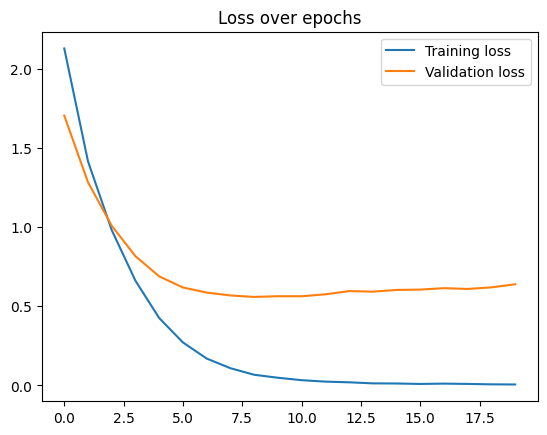

In [45]:
plt.plot(train_losses, label='Training loss')
plt.plot(val_losses, label='Validation loss')
plt.legend()
plt.title("Loss over epochs")
plt.show()

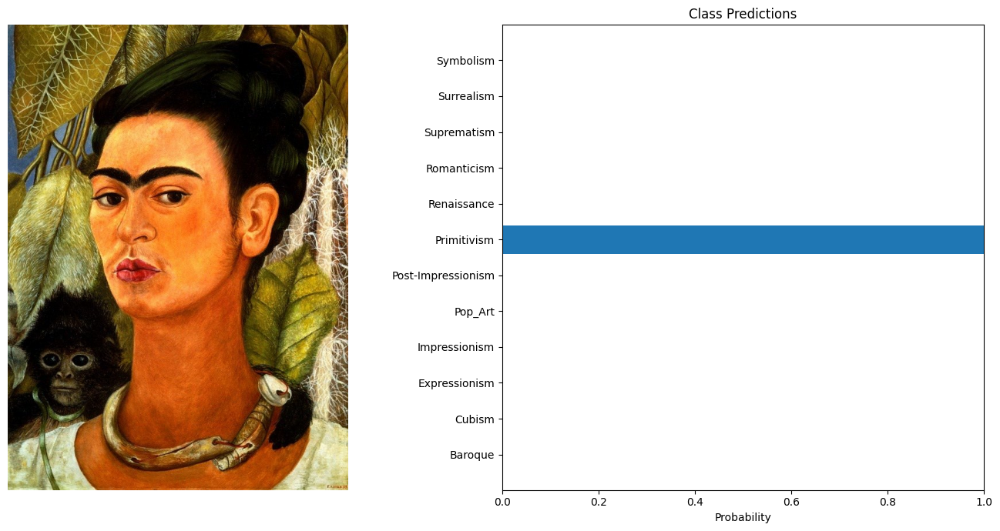

In [46]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess the image
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    return image, transform(image).unsqueeze(0)

# Predict using the model
def predict(model, image_tensor, device):
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.to(device)
        outputs = model(image_tensor)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
    return probabilities.cpu().numpy().flatten()

# Visualization
def visualize_predictions(original_image, probabilities, class_names):
    fig, axarr = plt.subplots(1, 2, figsize=(14, 7))
    
    # Display image
    axarr[0].imshow(original_image)
    axarr[0].axis("off")
    
    # Display predictions
    axarr[1].barh(class_names, probabilities)
    axarr[1].set_xlabel("Probability")
    axarr[1].set_title("Class Predictions")
    axarr[1].set_xlim(0, 1)

    plt.tight_layout()
    plt.show()

# Example usage
test_image = "dataset/test/Primitivism/Frida_Kahlo_5.jpg"
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

original_image, image_tensor = preprocess_image(test_image, transform)
probabilities = predict(model, image_tensor, device)

# Assuming dataset.classes gives the class names
class_names = dataset.classes 
visualize_predictions(original_image, probabilities, class_names)

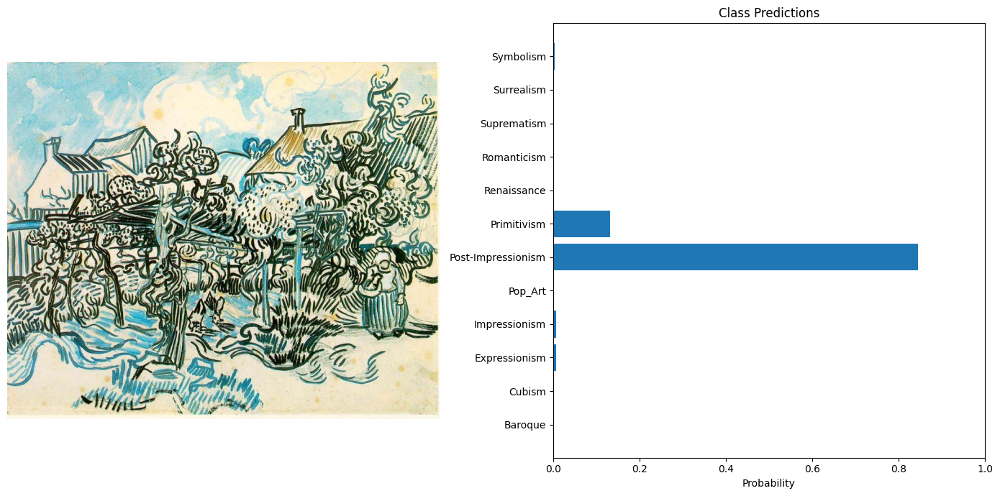

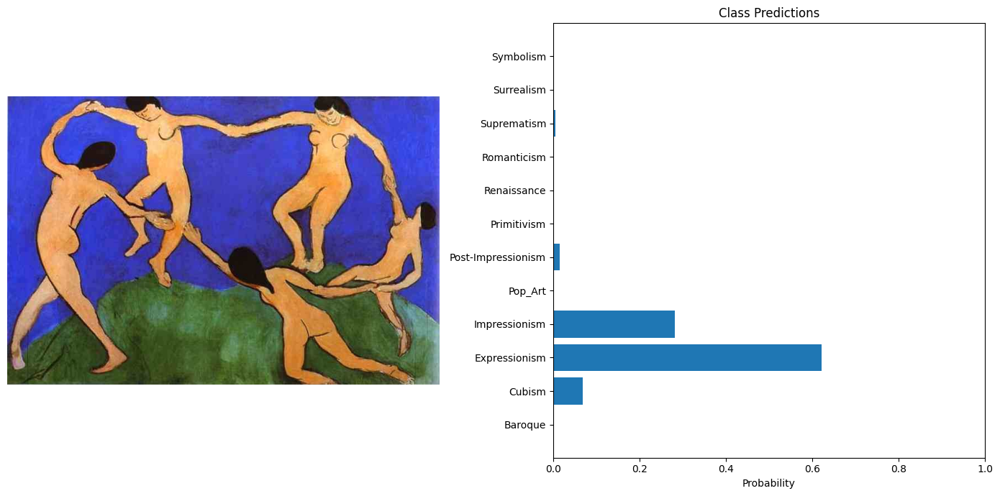

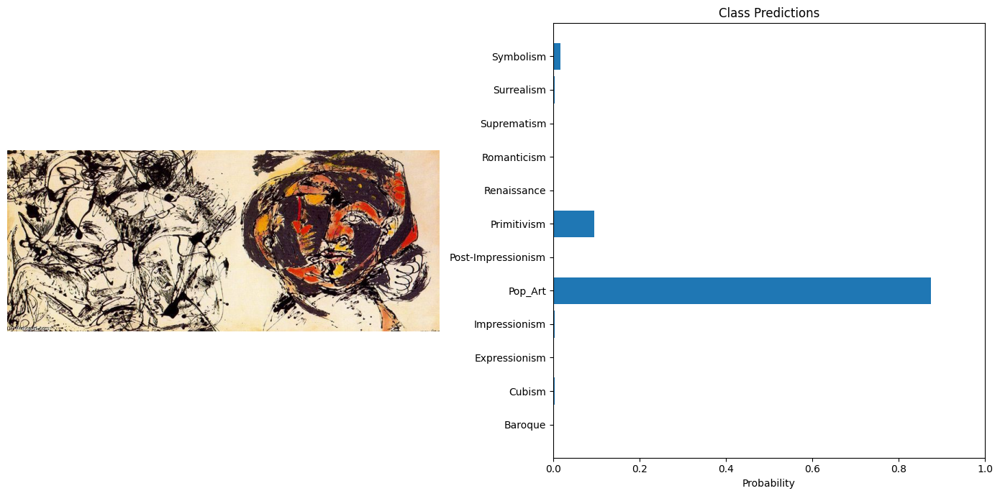

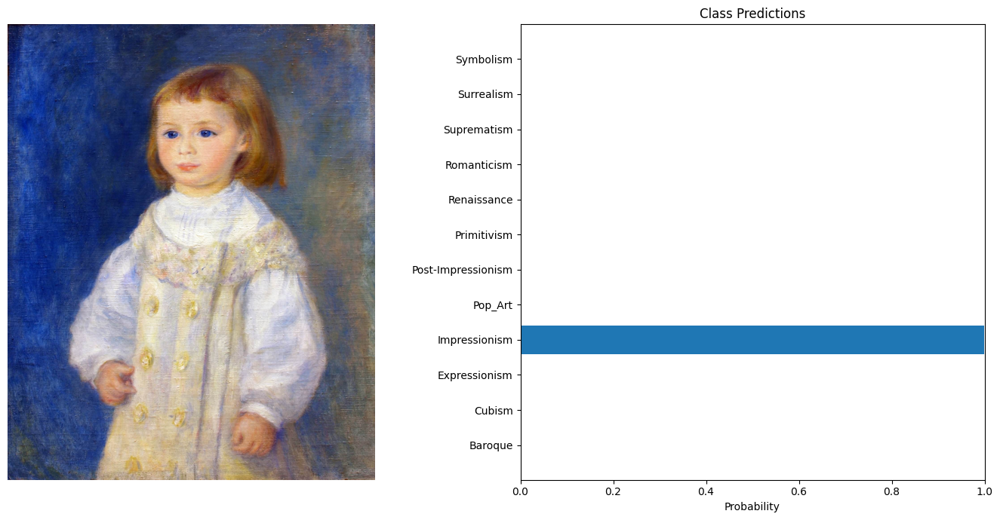

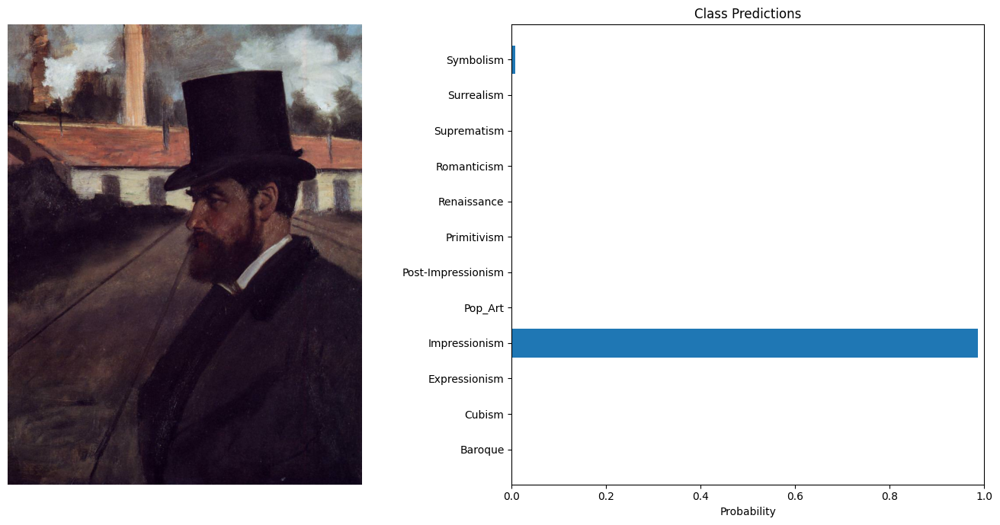

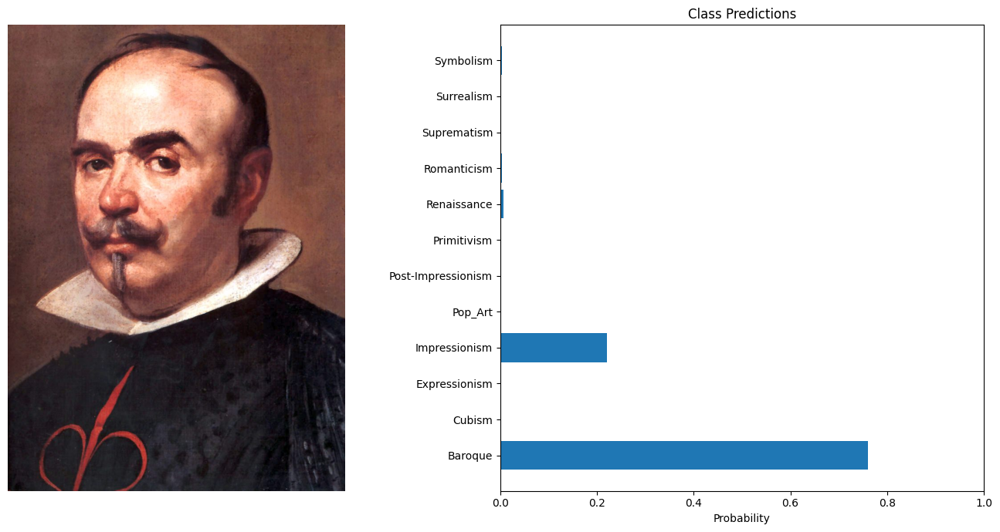

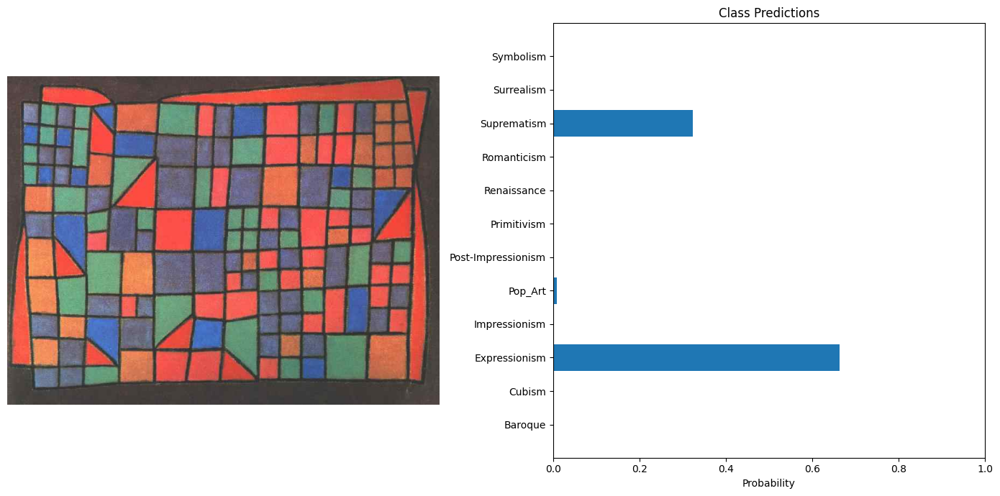

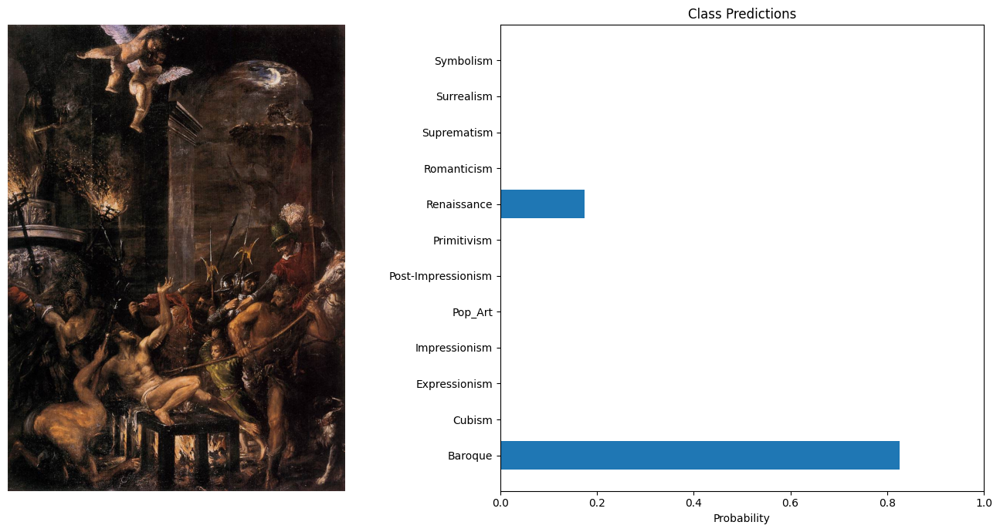

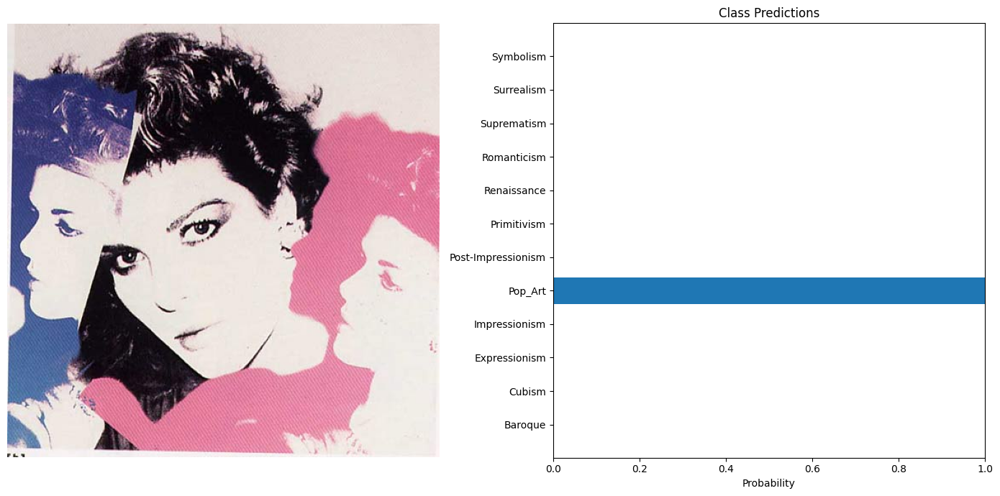

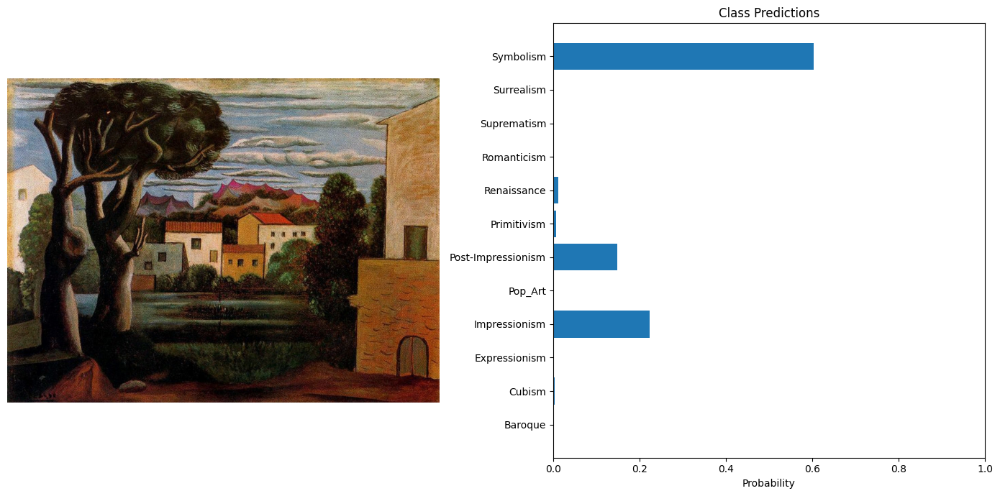

In [47]:
from glob import glob
test_images = glob('dataset/test/*/*')
test_examples = np.random.choice(test_images, 10)

for example in test_examples:
    original_image, image_tensor = preprocess_image(example, transform)
    probabilities = predict(model, image_tensor, device)

    # Assuming dataset.classes gives the class names
    class_names = dataset.classes 
    visualize_predictions(original_image, probabilities, class_names)

In [48]:
model_save_path = 'model.pth'
torch.save(model.state_dict(), model_save_path)
print("Model saved successfully!")

Model saved successfully!
